## System setup

---


##### Importing modules


In [1]:
import os
import gc

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

plt.rcParams.update({"font.size": 16})

import cv2 as cv

from tensorflow.keras.layers import (
    Rescaling,
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    Dropout,
    Flatten,
    Dense,
)
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory

from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

from tqdm import tqdm, trange

from toolkit.classes import DataSet, ImageProcessor, Augmenter, Model

2023-01-05 00:29:09.313274: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-05 00:29:09.574159: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/demust/py39/lib/python3.9/site-packages/cv2/../../lib64:
2023-01-05 00:29:09.574193: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-01-05 00:29:10.533608: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror:

## Read dataset

---


##### Create image dataframe


In [2]:
images = DataSet()

In [3]:
datasets = ["raw", "data", "augmented", "preprocessed"]
for dataset in datasets:
    images.update_dataset(dataset=dataset)


Found 150 images in ./raw/Train/Non defective/
Found 150 images in ./raw/Train/Defective/
Found 31 images in ./raw/Validation/Non defective/
Found 31 images in ./raw/Validation/Defective/
Found 11 images in ./raw/Test/Non defective/
Found 11 images in ./raw/Test/Defective/
Found 150 images in ./data/Train/Non defective/
Found 150 images in ./data/Train/Defective/
Found 31 images in ./data/Validation/Non defective/
Found 31 images in ./data/Validation/Defective/
Found 11 images in ./data/Test/Non defective/
Found 11 images in ./data/Test/Defective/
Found 25 images in ./augmented/Train/Non defective/
Found 25 images in ./augmented/Train/Defective/
Found 0 images in ./preprocessed/Train/Non defective/
Found 0 images in ./preprocessed/Train/Defective/
Found 0 images in ./preprocessed/Validation/Non defective/
Found 0 images in ./preprocessed/Validation/Defective/
Found 0 images in ./preprocessed/Test/Non defective/
Found 0 images in ./preprocessed/Test/Defective/


##### Generate random sample from training data


In [4]:
images.generate_random_sample(size=1)
images.random_sample

,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
0,train,0,Non defective,./data/Train/Non defective/,120.jpg,./data/Train/Non defective/120.jpg,0,0,0,0.0,0.0,0.0
1,train,1,Defective,./data/Train/Defective/,179.jpg,./data/Train/Defective/179.jpg,0,0,0,0.0,0.0,0.0


##### Visualize random sample


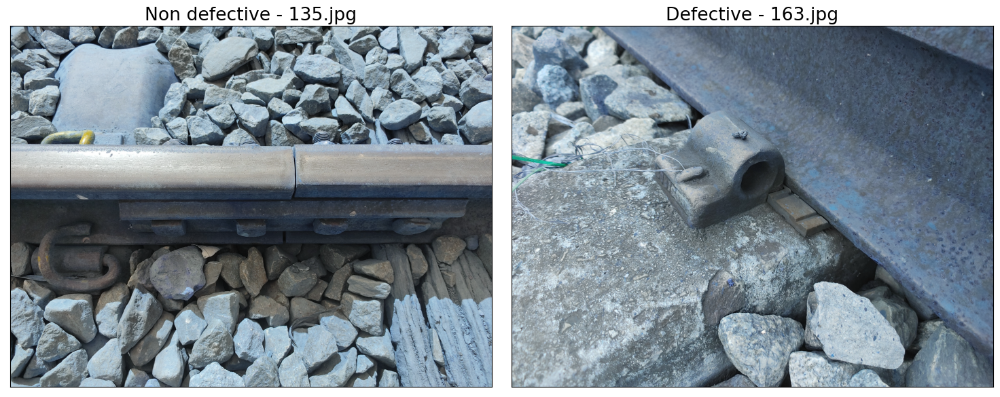

In [ ]:
images.show_random_sample()

## Playground

---


#### Configuration


In [5]:
kwargs = {
    "crop": {"ratio": 0.1},
    "resize": {"height": 256, "width": 256},
    "rotate": {"angle": 45},
    "hist_eq": {
        "type": "CLAHE",
        "size": (16, 16),
    },
    "threshold": {"type": "otsu"},
    "noise_filt": {"type": "Gaussian", "size": (11, 11)},
    "edge_detector": {"type": "Laplacian", "size": 1, "low": 20, "high": 120},
    "Hough": {"minLineLength": 20, "maxLineGap": 2, "maxLines": 1},
    "feat_detect": {"type": "ORB"},
}

plot_kwargs = {
    "rotate": {"cmap": "gray"},
    "grayscale": {"cmap": "gray"},
    "hist_eq": {"cmap": "gray"},
    "stretching": {"cmap": "gray"},
    "threshold": {"cmap": "gray"},
    "noise_filt": {"cmap": "gray"},
    "edge_detector": {"cmap": "gray"},
    "Hough": {"cmap": "gray"},
    "feat_detect": {"cmap": "gray"},
}

steps = ["original", "resize", "grayscale", "hist_eq", "noise_filt", "threshold", "edge_detector", "show"]

#### Manual process

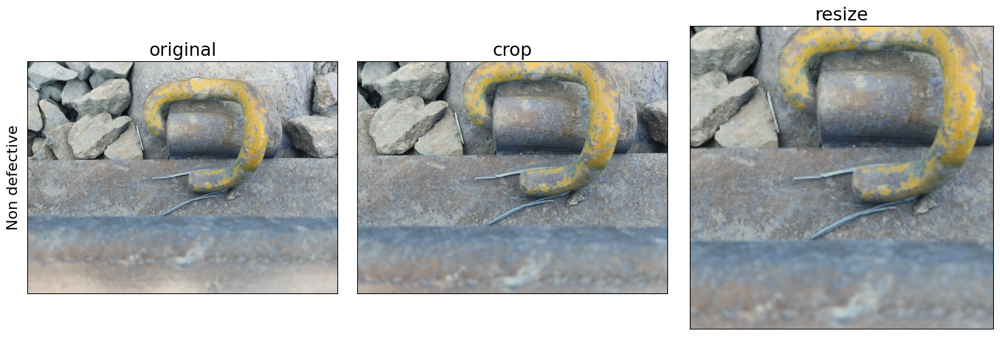

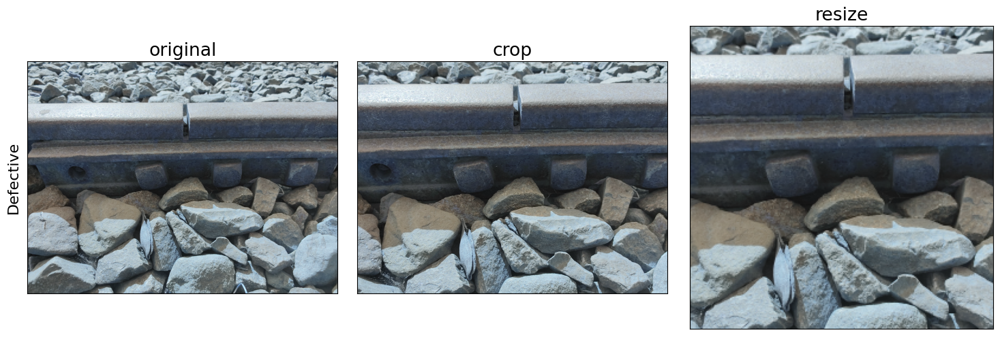

In [8]:
for img in images.random_sample.itertuples():
    img_proc = ImageProcessor(kwargs=kwargs, plot_kwargs=plot_kwargs)
    img_proc.load_sample(img)
    img_proc.crop()
    img_proc.resize()
    # img_proc.grayscale()
    # img_proc.hist_eq()
    # img_proc.noise_filt()
    # img_proc.threshold()
    # img_proc.edge_detector()
    # img_proc.Hough()
    img_proc.show()
    

In [9]:
print(img_proc.imgs[0].shape)
print(img_proc.imgs[1].shape)
print(img_proc.imgs[2].shape)

(3000, 4000, 3)
(2400, 3200, 3)
(256, 256, 3)


#### Automated process


0it [00:00, ?it/s]

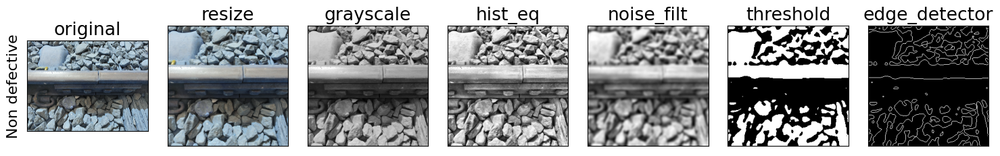

1it [00:02,  2.37s/it]

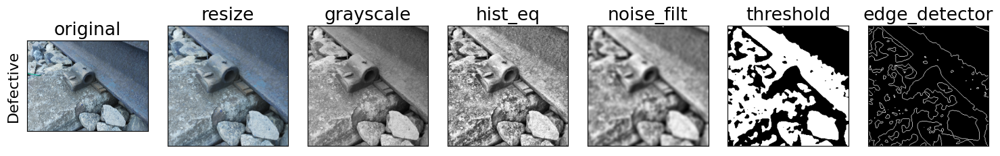

2it [00:04,  2.48s/it]


In [11]:
tester = ImageProcessor(steps, kwargs, plot_kwargs)
tester.process_images(images.random_sample)

del tester


#### Watershed

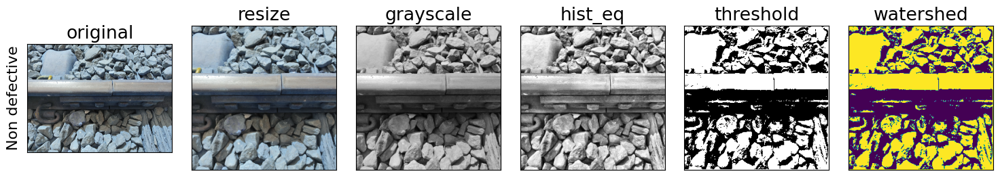

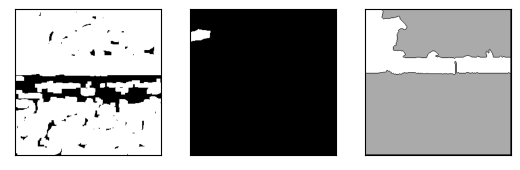

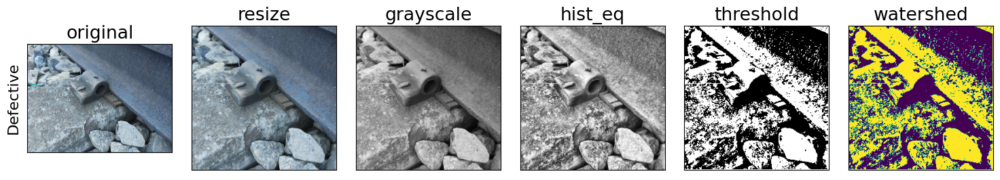

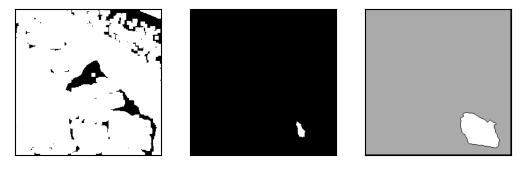

In [12]:
for img in images.random_sample.itertuples():
    img_proc = ImageProcessor(kwargs=kwargs, plot_kwargs=plot_kwargs)
    img_proc.load_sample(img)
    img_proc.resize()
    img_proc.grayscale()
    img_proc.hist_eq()
    # img_proc.noise_filt()
    img_proc.threshold()

    kernel = np.ones((3, 3), np.uint8)
    
    sure_bg = cv.dilate(img_proc.imgs[-1], kernel, iterations=3)
    dist_transform = cv.distanceTransform(img_proc.imgs[-1],cv.DIST_L2,5)
    ret, sure_fg = cv.threshold(dist_transform,0.7*dist_transform.max(),255,0) 
    sure_fg = np.uint8(sure_fg)
    unknown = cv.subtract(sure_bg,sure_fg)
    ret, markers = cv.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown==255] = 0
    tmp = np.zeros((*img_proc.imgs[-1].shape[:2], 3), np.uint8)
    tmp[:,:,0] = img_proc.imgs[-1]
    markers = cv.watershed(tmp, markers)
    
    img_proc.imgs.append(img_proc.imgs[-1])
    img_proc.steps.append("watershed")
    img_proc.imgs[-1][markers == -1] = 255
    
    img_proc.show()
    
    _, ax = plt.subplots(1, 3)
    
    ax[0].imshow(sure_bg, cmap='gray')
    ax[1].imshow(sure_fg, cmap='gray')
    ax[2].imshow(markers, cmap='gray')
    
    ax[0].set_xticks(ticks=[])
    ax[0].set_yticks(ticks=[])
    ax[1].set_xticks(ticks=[])
    ax[1].set_yticks(ticks=[])
    ax[2].set_xticks(ticks=[])
    ax[2].set_yticks(ticks=[])
    

#### Window scan

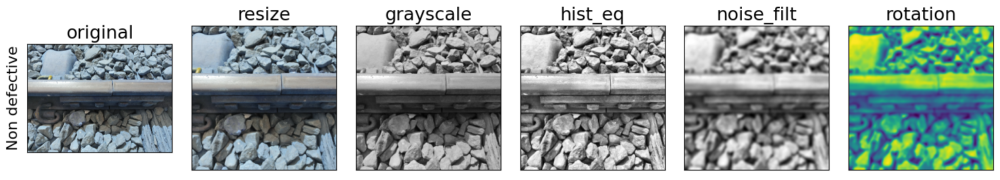

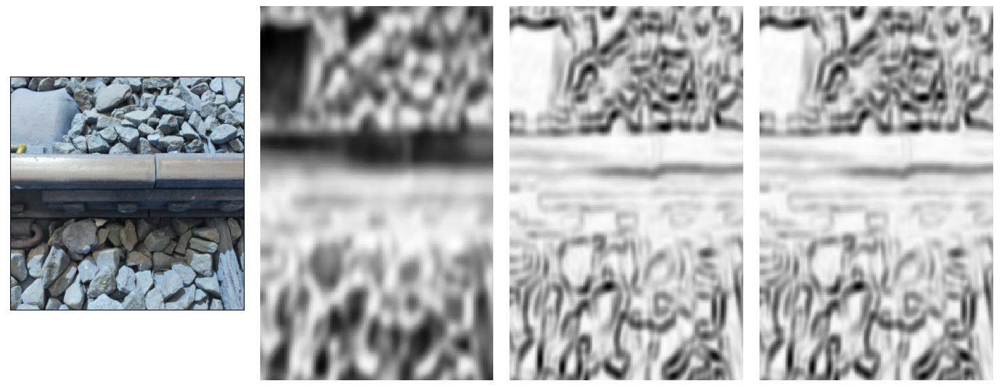

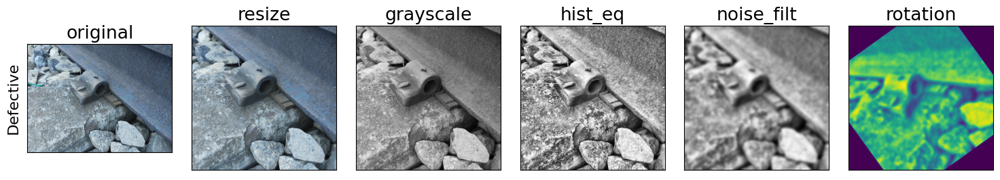

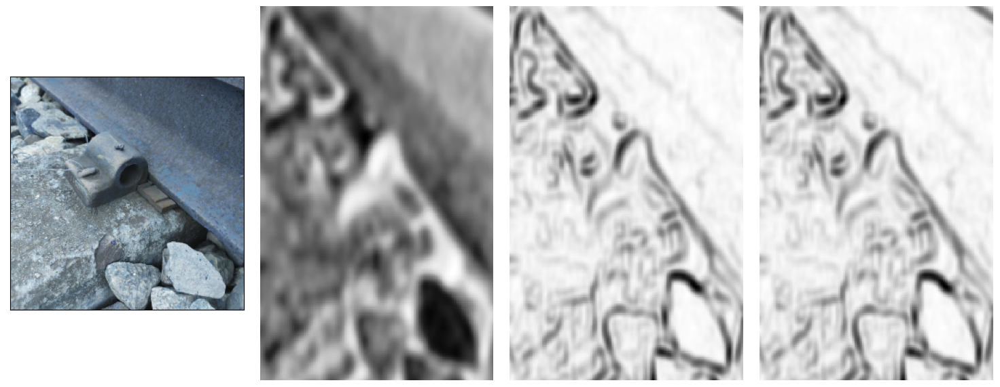

In [13]:
kx, ky = 10, 10

for img in images.random_sample.itertuples():
    img_proc = ImageProcessor(kwargs=kwargs, plot_kwargs=plot_kwargs)
    img_proc.load_sample(img)
    img_proc.resize()
    img_proc.grayscale()
    img_proc.hist_eq()
    img_proc.noise_filt()

    height, width = img_proc.imgs[-1].shape[:2]

    means = np.zeros(shape=(height-ky, width-kx))
    stds = np.zeros(shape=(height-ky, width-kx))
    result = np.zeros(shape=(height-ky, width-kx))
    
    for i in range(height-ky):
        for j in range(width-kx):
            means[i, j] = np.mean(img_proc.imgs[-1][i:i+ky, j:j+kx])
            stds[i, j] = np.std(img_proc.imgs[-1][i:i+ky, j:j+kx])
    
    result = stds
    img_proc.steps.append("scan")
    img_proc.imgs.append(np.uint8(result))
  
    
    
    img_proc.edge_detector()
    img_proc.Hough()
    
    x1, y1, x2, y2 = img_proc.lines[0][0]
    if x2 > x1:
        angle = np.arctan((y2-y1) / (x2-x1)) * 180 / np.pi    
    else:
        angle = -np.arctan((y2-y1) / (x2-x1)) * 180 / np.pi    
    
    kwargs.update({"rotate": {"angle": angle}})
    
    for _ in range(3):
        img_proc.imgs.pop(-1)
        img_proc.steps.pop(-1)
    
    img_proc.rotate()

    img_proc.show()
    
    _, ax = plt.subplots(1, 4, figsize=(15, 6), tight_layout=True)
    ax[0].imshow(img_proc.imgs[1])
    sns.heatmap(means, cbar=False, cmap='Greys', ax=ax[1])
    sns.heatmap(stds, cbar=False, cmap='Greys', ax=ax[2])
    sns.heatmap(result, cbar=False, cmap='Greys', ax=ax[3])
    ax[0].set_xticks(ticks=[])
    ax[0].set_yticks(ticks=[])
    ax[1].set_xticks(ticks=[])
    ax[1].set_yticks(ticks=[])
    ax[2].set_xticks(ticks=[])
    ax[2].set_yticks(ticks=[])
    ax[3].set_xticks(ticks=[])
    ax[3].set_yticks(ticks=[])
    

#### Contours


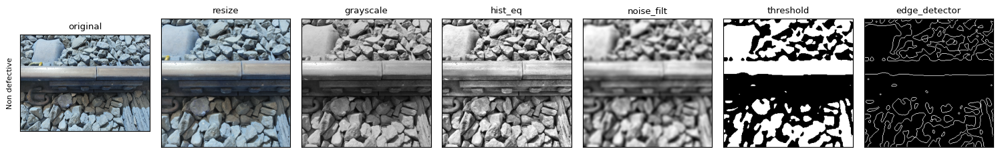

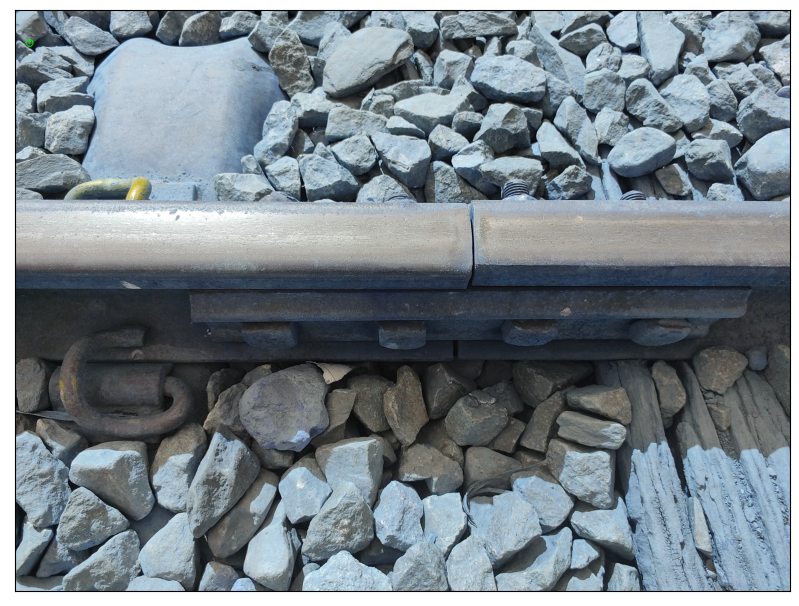

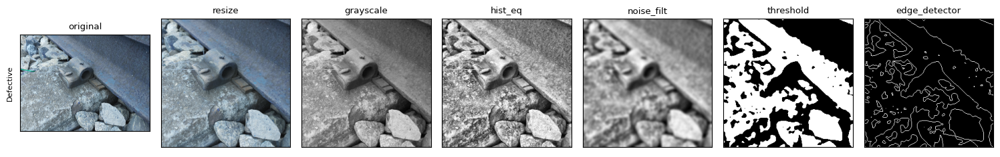

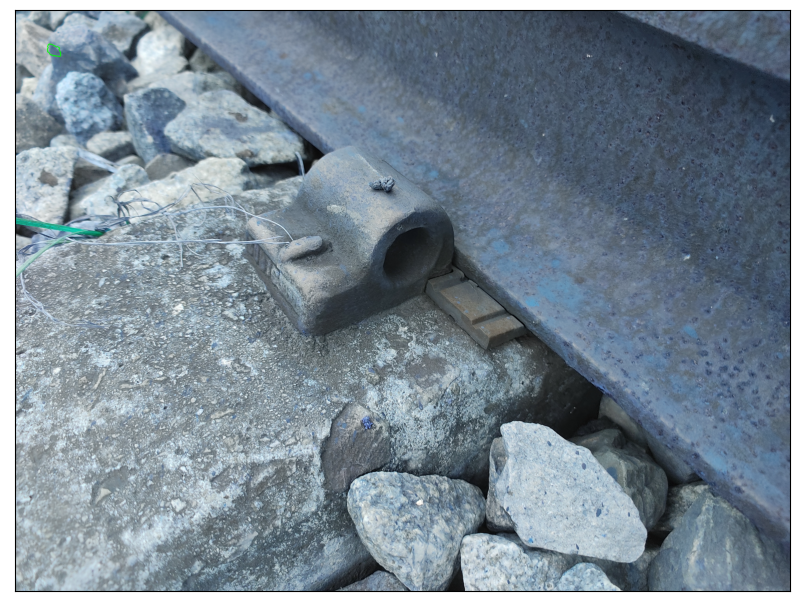

In [15]:
def func(cnt):
    return cv.contourArea(cnt) / max(1, cv.arcLength(cnt, False))


for i in range(len(images.random_sample.index)):
    img_proc = ImageProcessor(steps, kwargs, plot_kwargs)
    img_proc.load_sample(images.random_sample.iloc[i])
    img_proc.resize()
    img_proc.grayscale()
    img_proc.hist_eq()
    img_proc.noise_filt()
    img_proc.threshold()
    img_proc.edge_detector()
    img_proc.show()
    contours, _ = cv.findContours(
        img_proc.imgs[-1], cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE
    )
    contours = sorted(contours, key=func, reverse=True)[:1]
    contour_img = cv.drawContours(img_proc.imgs[0], contours, -1, (0, 255, 0), 3)
    _, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(contour_img, cmap="gray")
    ax.set_xticks(ticks=[])
    ax.set_yticks(ticks=[])
    del img_proc


#### Feature matching


IndexError: too many indices for array: array is 3-dimensional, but 4 were indexed

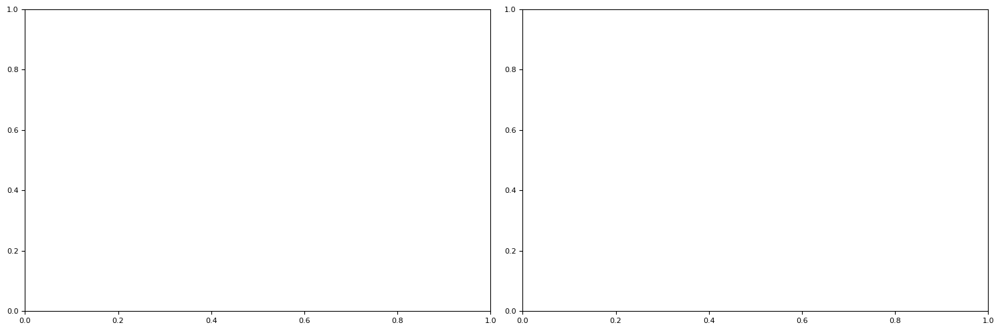

In [16]:
img = []
orb = cv.ORB_create()
kp = []
des = []

fig, ax = plt.subplots(len(images.random_sample.index) // 2, 2, figsize=(15, 5 * len(images.random_sample.index) // 2), tight_layout=True)
ax = ax.flatten()
for i in range(len(images.random_sample.index)):
    img_proc = ImageProcessor(steps, kwargs, plot_kwargs)
    img_proc.load_sample(images.random_sample.iloc[i])
    img_proc.crop()
    img_proc.grayscale()
    img_proc.hist_eq()
    img_proc.noise_filt()

    img.append(img_proc.imgs[-1])
    del img_proc
    kpi, desi = orb.detectAndCompute(img[i], None)
    kp.append(kpi)
    des.append(desi)
    img[i] = cv.drawKeypoints(img[i], kp[i], img[i])

    ax[i].imshow(img[i], cmap="gray")
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])

plt.show()

bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des[0], des[1])

img_m = cv.drawMatches(
    img[0],
    kp[0],
    img[1],
    kp[1],
    matches,
    None,
    flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)

fig, ax = plt.subplots(figsize=(15, 10), tight_layout=True)
ax.set_xticks(ticks=[])
ax.set_yticks(ticks=[])
ax.imshow(img_m)
plt.show()


#### Histograms


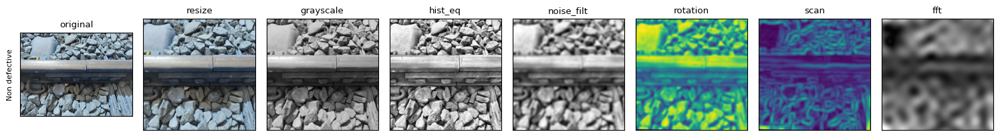

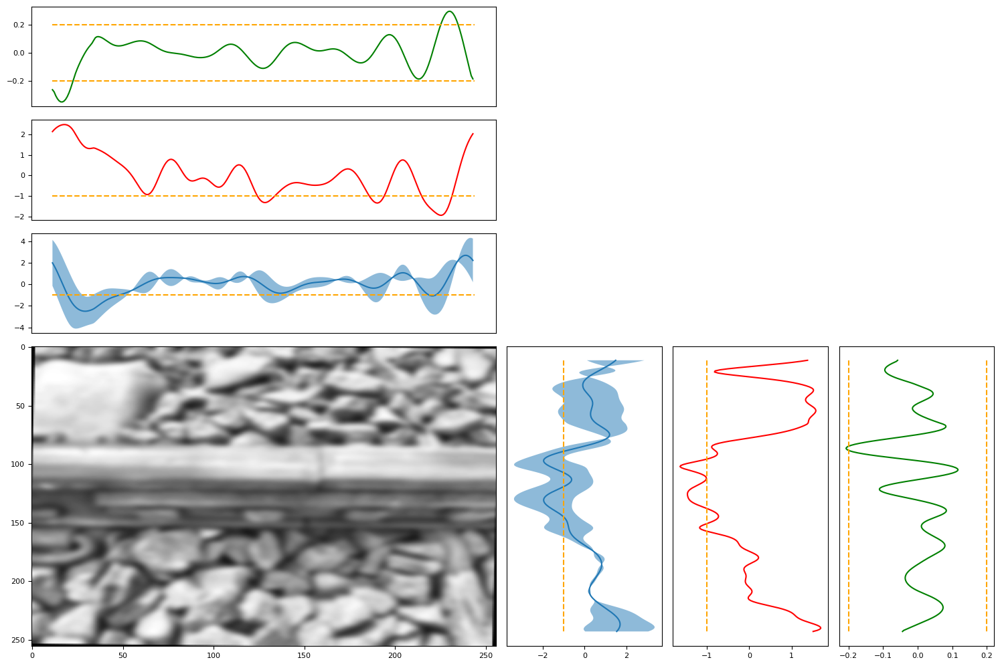

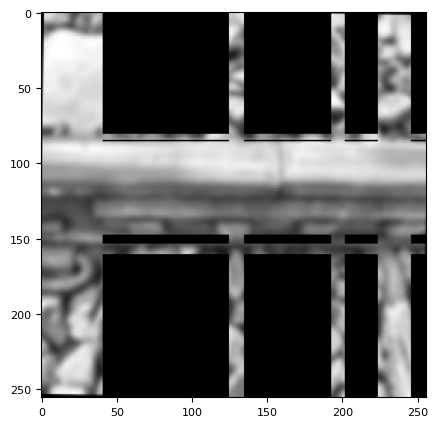

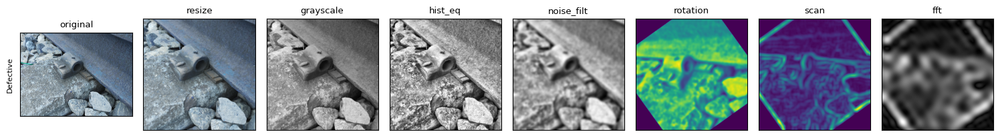

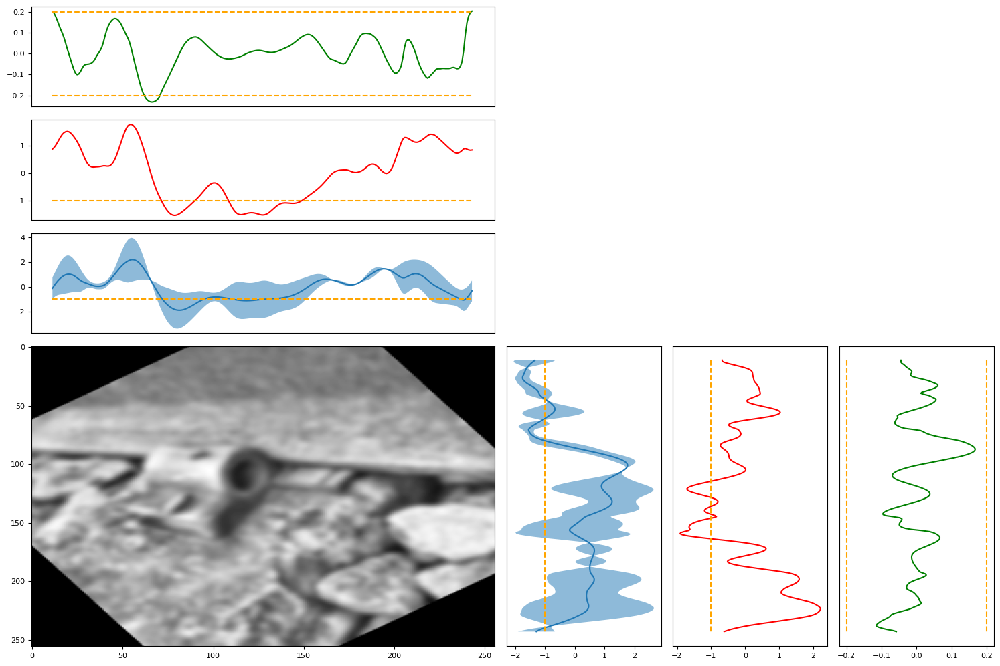

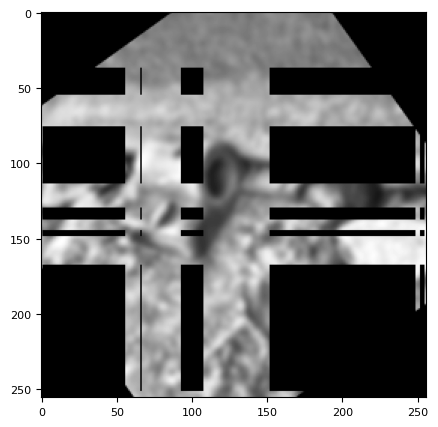

In [17]:
rate = 8
kx, ky = 10, 10
for each in images.random_sample.itertuples():
    img_proc = ImageProcessor(kwargs=kwargs, plot_kwargs=plot_kwargs)
    img_proc.load_sample(each)
    img_proc.resize()
    img_proc.grayscale()
    img_proc.hist_eq()
    img_proc.noise_filt()

    height, width = img_proc.imgs[-1].shape[:2]

    means = np.zeros(shape=(height, width))
    stds = np.zeros(shape=(height, width))
    result = np.zeros(shape=(height, width))  
    for i in range(height):
        for j in range(width):
            means[i, j] = np.mean(img_proc.imgs[-1][i:i+ky, j:j+kx])
            stds[i, j] = np.std(img_proc.imgs[-1][i:i+ky, j:j+kx])
    
    result = stds
    img_proc.steps.append("scan")
    img_proc.imgs.append(np.uint8(result))
    img_proc.edge_detector()
    img_proc.Hough()
    
    x1, y1, x2, y2 = img_proc.lines[0][0]
    if x2 > x1:
        angle = np.arctan((y2-y1) / (x2-x1)) * 180 / np.pi    
    else:
        angle = -np.arctan((y2-y1) / (x2-x1)) * 180 / np.pi    
    
    kwargs.update({"rotate": {"angle": angle}})
    
    for _ in range(3):
        img_proc.imgs.pop(-1)
        img_proc.steps.pop(-1)
    
    img_proc.rotate()

    means = np.zeros(shape=(height, width))
    stds = np.zeros(shape=(height, width))
    result = np.zeros(shape=(height, width))
    
    for i in range(height):
        for j in range(width):
            means[i, j] = np.mean(img_proc.imgs[-1][i:i+ky, j:j+kx])
            stds[i, j] = np.std(img_proc.imgs[-1][i:i+ky, j:j+kx])
    
    result = stds
    img_proc.steps.append("scan")
    img_proc.imgs.append(np.uint8(result))

    img_height, img_width = img_proc.imgs[-1].shape[:2]
    crow, ccol = int(img_height / 2), int(img_width / 2)

    LPfilt = np.zeros((img_height, img_width, 2), np.uint8)
    LPfilt[crow - rate : crow + rate, ccol - rate : ccol + rate] = 1

    dft = cv.dft(np.float32(img_proc.imgs[-1]), flags=cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    fshift = dft_shift * LPfilt
    f_ishift = np.fft.ifftshift(fshift)
    img = cv.idft(f_ishift)
    img_proc.imgs.append(cv.magnitude(img[:, :, 0], img[:, :, 1]))
    img_proc.steps.append("fft")
    img_proc.plot_kwargs.update({"fft": {"cmap": "gray"}})


    img_proc.show()

    fig = plt.figure(figsize=(15, 10), tight_layout=True)
    gs = gridspec.GridSpec(
        nrows=4,
        ncols=4,
        figure=fig,
        height_ratios=[1, 1, 1, 3],
        width_ratios=[3, 1, 1, 1],
    )
    ax = [
        fig.add_subplot(gs[0, 0]),
        fig.add_subplot(gs[1, 0]),
        fig.add_subplot(gs[2, 0]),
        fig.add_subplot(gs[3, 0]),
        fig.add_subplot(gs[3, 1]),
        fig.add_subplot(gs[3, 2]),
        fig.add_subplot(gs[3, 3]),
    ]

    hist_img = img_proc.imgs[-1]
    shape = np.array(hist_img.shape[:2])
    
    mask = np.zeros(shape=shape, dtype=np.uint8)

    ax[3].imshow(img_proc.imgs[5], cmap="gray", aspect="auto")

    col_means = np.mean(hist_img, axis=0)
    row_means = np.mean(hist_img, axis=1)
    col_stds = np.std(hist_img, axis=0)
    row_stds = np.std(hist_img, axis=1)

    col_means = (col_means - np.mean(col_means)) / np.std(col_means)
    row_means = (row_means - np.mean(row_means)) / np.std(row_means)
    col_stds = (col_stds - np.mean(col_stds)) / np.std(col_stds)
    row_stds = (row_stds - np.mean(row_stds)) / np.std(row_stds)

    ax[0].plot(np.arange(hist_img.shape[1]), np.gradient(col_means), "g-")
    ax[0].hlines(
        0.2,
        0,
        img_width,
        colors="orange",
        linestyles="dashed",
    )
    ax[0].hlines(
        -0.2,
        0,
        img_width,
        colors="orange",
        linestyles="dashed",
    )
    ax[0].set_xticks(ticks=[])

    ax[1].plot(np.arange(hist_img.shape[1]), col_stds, "r-")
    ax[1].hlines(
        -1,
        0,
        img_width,
        colors="orange",
        linestyles="dashed",
    )
    ax[1].set_xticks(ticks=[])

    ax[2].plot(np.arange(hist_img.shape[1]), col_means)
    ax[2].hlines(
        -1,
        0, 
        img_width, 
        colors="orange",
        linestyles="dashed",
    )
    ax[2].fill_between(
        np.arange(hist_img.shape[1]),
        col_means - col_stds,
        col_means + col_stds,
        alpha=0.5,
    )
    ax[2].set_xticks(ticks=[])
    
    ax[4].plot(
        row_means,
        -np.arange(hist_img.shape[0]),
    )
    ax[4].vlines(
        -1,
        0,
        -img_height,
        colors="orange",
        linestyles="dashed",
    )
    ax[4].fill_betweenx(
        -np.arange(hist_img.shape[0]),
        row_means - row_stds,
        row_means + row_stds,
        alpha=0.5,
    )
    ax[4].set_yticks(ticks=[])

    ax[5].plot(row_stds, -np.arange(hist_img.shape[0]), "r-")
    ax[5].vlines(
        -1,
        0,
        -img_height,
        colors="orange",
        linestyles="dashed",
    )
    ax[5].set_yticks(ticks=[])

    ax[6].plot(np.gradient(row_means), -np.arange(hist_img.shape[0]), "g-")
    ax[6].vlines(
        0.2,
        0,
        -img_height,
        colors="orange",
        linestyles="dashed",
    )
    ax[6].vlines(
        -0.2,
        0,
        -img_height,
        colors="orange",
        linestyles="dashed",
    )
    ax[6].set_yticks(ticks=[])

    for i in range(img_width):
        if col_means[i] < -1:
            mask[:, i] = 1
        if col_stds[i] < -1:
            mask[:, i] = 1
        if np.gradient(col_means)[i] > 0.2:
            mask[:, i] = 1
        if np.gradient(col_means)[i] < -0.2:
            mask[:, i] = 1

    for i in range(img_height):
        if row_means[i] < -1:
            mask[i, :] = 1
        if row_stds[i] < -1:
            mask[i, :] = 1
        if np.gradient(row_means)[i] > 0.2:
            mask[i, :] = 1
        if np.gradient(row_means)[i] < -0.2:
            mask[i, :] = 1

    plt.show()

    # p = np.unravel_index(np.argmin(mask[40:200, 40:200], keepdims=True), mask[40:200, 40:200].shape)
    # px = p[1]+40
    # mask_idx = np.nonzero(mask[:-1, px] - mask[1:, px])[0]
    # if len(mask_idx) > 2:
    #     mask[mask_idx[0]:mask_idx[-1], :] = 1
        
    # p = np.unravel_index(np.argmin(mask[40:200, 40:200], keepdims=True), mask[40:200, 40:200].shape)
    # py = p[0]+40
    # mask_idx = np.nonzero(mask[py, :-1] - mask[py, 1:])[2]
    # if len(mask_idx) > 2:
    #     mask[:, mask_idx[0]:mask_idx[-1]] = 1
    

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(
        cv.bitwise_and(img_proc.imgs[5], img_proc.imgs[5], mask=mask), cmap="gray"
    )
    plt.show()
    del img_proc
